<h1>Capstone EDA Notebook</h1>

Imports

In [35]:
import pandas as pd
import matplotlib as plt
import seaborn as sns
import plotly as plty
import plotly.plotly as py
import plotly.figure_factory as ff
import numpy as np
# from bokeh.models import ColumnDataSource, LabelSet
# from bokeh.plotting import figure, show, output_file

Design Features for Plotly and Bokeh Plots

In [36]:
plty.tools.set_credentials_file(username='katrinafmiller', api_key='qOzSeIk6FXndYej9OPCt')

In [37]:
colors1 ="#F27769"
colors2a = ["#F27769", "#FFCCBE"]
colors2b = ["#FFCCBE", "#4145CB"]
colors3 = ["#F27769", "#FFCCBE", "#4145CB"]
colors4 = ["#F27769", "#FFCCBE", "#4145CB", "#8587FA"]

Import Data

In [38]:
df = pd.read_csv("../capstone/clean_data.csv")

try:
    df.drop("Unnamed: 0", axis = 1, inplace = True)
except:
    pass

ppq = pd.read_csv("../capstone/ProteinAndPathologyQuantifications.csv")
try:
    ppq.drop("Unnamed: 0", axis = 1, inplace = True)
except:
    pass

grey = pd.read_csv("../capstone/greymatter.csv")
try:
    grey.drop("Unnamed: 0", axis = 1, inplace = True)
except:
    pass

white = pd.read_csv("../capstone/whitematter.csv")
try:
    white.drop("Unnamed: 0", axis = 1, inplace = True)
except:
    pass

In [39]:
df

,donor_id,name,age,sex,apo_e4_allele,education_years,age_at_first_tbi,longest_loc_duration,cerad,num_tbi_w_loc,dsm_iv_clinical_diagnosis,control_set,nincds_arda_diagnosis,ever_tbi_w_loc,race,hispanic,act_demented,braak,nia_reagan
0,326765665,H14.09.078,87,M,N,16,0,Unknown or N/A,0,0,No Dementia,31,No Dementia,N,White,Not Hispanic,No Dementia,1,1
1,326765656,H14.09.069,95-99,M,N,17,12,1-2 min,2,1,No Dementia,26,No Dementia,Y,White,Not Hispanic,No Dementia,5,2
2,326765654,H14.09.067,85,M,Y,10,72,< 10 sec,3,1,Vascular,25,"Dementia, Type Unknown",Y,White,Not Hispanic,Dementia,4,2
3,467056391,H15.09.103,90-94,F,N,11,87,< 10 sec,0,1,No Dementia,52,No Dementia,Y,White,Not Hispanic,No Dementia,4,0
4,309335447,H14.09.010,100+,M,Y,16,0,Unknown or N/A,3,0,Alzheimer's Disease Type,28,Possible Alzheimer'S Disease,N,White,Not Hispanic,Dementia,4,2
5,309335457,H14.09.020,95-99,F,N,18,0,Unknown or N/A,2,0,No Dementia,1,No Dementia,N,Non-white,Not Hispanic,No Dementia,3,2
6,326765681,H14.09.094,78,M,N,18,0,Unknown or N/A,1,0,No Dementia,46,No Dementia,N,White,Not Hispanic,No Dementia,2,1
7,326765648,H14.09.061,89,F,N,16,6,< 10 sec,1,1,Multiple Etiologies,22,Possible Alzheimer'S Disease,Y,White,Not Hispanic,Dementia,2,1
8,326765657,H14.09.070,95-99,M,N,16,0,Unknown or N/A,0,0,No Dementia,26,No Dementia,N,White,Not Hispanic,No Dementia,2,1
9,309335443,H14.09.006,90-94,F,N,14,0,Unknown or N/A,0,0,No Dementia,16,No Dementia,N,White,Not Hispanic,No Dementia,3,1


In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100 entries, 0 to 99
Data columns (total 19 columns):
donor_id                     100 non-null int64
name                         100 non-null object
age                          100 non-null object
sex                          100 non-null object
apo_e4_allele                100 non-null object
education_years              100 non-null int64
age_at_first_tbi             100 non-null int64
longest_loc_duration         100 non-null object
cerad                        100 non-null int64
num_tbi_w_loc                100 non-null int64
dsm_iv_clinical_diagnosis    100 non-null object
control_set                  100 non-null int64
nincds_arda_diagnosis        100 non-null object
ever_tbi_w_loc               100 non-null object
race                         100 non-null object
hispanic                     100 non-null object
act_demented                 100 non-null object
braak                        100 non-null int64
nia_reagan           

In [41]:
df.describe()

,donor_id,education_years,age_at_first_tbi,cerad,num_tbi_w_loc,control_set,braak,nia_reagan
count,1.000000e+02,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000,100.000000
mean,3.273480e+08,14.130000,21.030000,1.420000,0.610000,28.390000,3.340000,1.550000
std,3.941985e+07,3.255625,30.349631,1.084137,0.709175,15.795981,1.706908,0.845368
min,3.093354e+08,6.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000
25%,3.093355e+08,12.000000,0.000000,1.000000,0.000000,15.000000,2.000000,1.000000
50%,3.093355e+08,14.000000,1.500000,1.000000,0.500000,28.500000,3.000000,1.000000
75%,3.267657e+08,16.000000,24.500000,2.000000,1.000000,41.250000,5.000000,2.000000
max,4.670564e+08,21.000000,89.000000,3.000000,3.000000,55.000000,6.000000,3.000000


In [42]:
len(df[(df["education_years"] >= 16) & (df["sex"] == "F")]) / len(df)

0.09

In [43]:
len(df[(df["education_years"] >= 16) & (df["sex"] == "M")]) / len(df)

0.27

In [44]:
len(df[(df["education_years"] <= 12) & (df["sex"] == "F")]) / len(df)

0.14

In [45]:
len(df[(df["education_years"] <= 12) & (df["sex"] == "M")]) / len(df)

0.21

In [46]:
print("Braak score of 6, Mean Age of First TBI for Women in Study: {}".format((df[(df["braak"] >= 6) & (df["sex"] == "F")]["age_at_first_tbi"]).mean()))   
print("Braak score of 5, Mean Age of First TBI for Women in Study: {}".format((df[(df["braak"] >= 5) & (df["sex"] == "F")]["age_at_first_tbi"]).mean()))
print("Braak score of 4, Mean Age of First TBI for Women in Study: {}".format((df[(df["braak"] >= 4) & (df["sex"] == "F")]["age_at_first_tbi"]).mean()))
print("Braak score of 3, Mean Age of First TBI for Women in Study: {}".format((df[(df["braak"] >= 3) & (df["sex"] == "F")]["age_at_first_tbi"]).mean()))
print("Braak score of 2, Mean Age of First TBI for Women in Study: {}".format((df[(df["braak"] >= 2) & (df["sex"] == "F")]["age_at_first_tbi"]).mean()))
print("Braak score of 1, Mean Age of First TBI for Women in Study: {}".format((df[(df["braak"] >= 1) & (df["sex"] == "F")]["age_at_first_tbi"]).mean()))

Braak score of 6, Mean Age of First TBI for Women in Study: 60.833333333333336
Braak score of 5, Mean Age of First TBI for Women in Study: 39.09090909090909
Braak score of 4, Mean Age of First TBI for Women in Study: 39.5
Braak score of 3, Mean Age of First TBI for Women in Study: 29.466666666666665
Braak score of 2, Mean Age of First TBI for Women in Study: 27.571428571428573
Braak score of 1, Mean Age of First TBI for Women in Study: 28.486486486486488


In [47]:
print("Braak score of 6, Mean Age of First TBI for Men in Study: {}".format((df[(df["braak"] >= 6) & (df["sex"] == "M")]["age_at_first_tbi"]).mean()))   
print("Braak score of 5, Mean Age of First TBI for Men in Study: {}".format((df[(df["braak"] >= 5) & (df["sex"] == "M")]["age_at_first_tbi"]).mean()))
print("Braak score of 4, Mean Age of First TBI for Men in Study: {}".format((df[(df["braak"] >= 4) & (df["sex"] == "M")]["age_at_first_tbi"]).mean()))
print("Braak score of 3, Mean Age of First TBI for Men in Study: {}".format((df[(df["braak"] >= 3) & (df["sex"] == "M")]["age_at_first_tbi"]).mean()))
print("Braak score of 2, Mean Age of First TBI for Men in Study: {}".format((df[(df["braak"] >= 2) & (df["sex"] == "M")]["age_at_first_tbi"]).mean()))
print("Braak score of 1, Mean Age of First TBI for Men in Study: {}".format((df[(df["braak"] >= 1) & (df["sex"] == "M")]["age_at_first_tbi"]).mean()))

Braak score of 6, Mean Age of First TBI for Men in Study: 15.0
Braak score of 5, Mean Age of First TBI for Men in Study: 12.75
Braak score of 4, Mean Age of First TBI for Men in Study: 13.142857142857142
Braak score of 3, Mean Age of First TBI for Men in Study: 16.7
Braak score of 2, Mean Age of First TBI for Men in Study: 15.854166666666666
Braak score of 1, Mean Age of First TBI for Men in Study: 15.779661016949152


In [48]:
x1 = ((df[(df["sex"] == "F") & (df["age_at_first_tbi"] != 0)]["age_at_first_tbi"]))
x2 = ((df[(df["sex"] == "M") & (df["age_at_first_tbi"] != 0)]["age_at_first_tbi"]))

hist_data = [x1, x2]

group_labels = ['Age at First Traumatic Brain Injury (Women)', 'Age at First Traumatic Brain Injury (Men)']
colors = colors2a

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels, colors= colors2a, bin_size=7, show_curve=False)

# Add title
fig['layout'].update(title='Age at First Traumatic Brain Injury for Men and Women')

# Create distplot with custom bin_size
# fig = ff.create_distplot(hist_data, group_labels, colors= colors2b, bin_size= 7)

# Plot!
py.iplot(fig, filename= 'Curve and Rug')

In [33]:
import plotly.offline as plotly_offline
plotly_offline.init_notebook_mode()
div_plot = plotly_offline.plot(fig, 
                    filename='basic-line', 
                    include_plotlyjs=False, 
                    output_type='div')
print(div_plot)

<div id="f3aa5afe-2fdd-4128-ae87-e2a96efb7511" style="height: 100%; width: 100%;" class="plotly-graph-div"></div><script type="text/javascript">window.PLOTLYENV=window.PLOTLYENV || {};window.PLOTLYENV.BASE_URL="https://plot.ly";Plotly.newPlot("f3aa5afe-2fdd-4128-ae87-e2a96efb7511", [{"autobinx": false, "histnorm": "probability density", "legendgroup": "Age at First Traumatic Brain Injury (Women)", "marker": {"color": "#F27769"}, "name": "Age at First Traumatic Brain Injury (Women)", "opacity": 0.7, "x": [87, 6, 33, 79, 75, 89, 81, 63, 62, 15, 9, 78, 26, 47, 83, 89, 89, 67, 56, 3], "xaxis": "x", "xbins": {"end": 89.0, "size": 7, "start": 3.0}, "yaxis": "y", "type": "histogram", "uid": "61e30998-e0ad-11e8-8b99-3c15c2e5e204"}, {"autobinx": false, "histnorm": "probability density", "legendgroup": "Age at First Traumatic Brain Injury (Men)", "marker": {"color": "#FFCCBE"}, "name": "Age at First Traumatic Brain Injury (Men)", "opacity": 0.7, "x": [12, 72, 12, 21, 26, 11, 16, 47, 15, 86, 88, 

In [58]:
x1 = ((df[(df["sex"] == "F") & (df["age_at_first_tbi"] != 0)]["age_at_first_tbi"]))
x2 = ((df[(df["sex"] == "M") & (df["age_at_first_tbi"] != 0)]["age_at_first_tbi"]))

hist_data = [x1, x2]

group_labels = ['Age at First Traumatic Brain Injury (Women)', 'Age at First Traumatic Brain Injury (Men)']
colors = colors2a

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels, colors= colors2a, bin_size=7, show_hist=False, show_curve= True, curve_type = 'normal')

# Add title
fig['layout'].update(title='Age at First Traumatic Brain Injury for Men and Women')

# Create distplot with custom bin_size
# fig = ff.create_distplot(hist_data, group_labels, colors= colors2b, bin_size= 7)

# Plot!
py.iplot(fig, filename= 'Curve and Rug')

In [59]:
plotly_offline.init_notebook_mode()
div_plot = plotly_offline.plot(fig, 
                    filename='basic-line', 
                    include_plotlyjs=False, 
                    output_type='div')
print(div_plot)

<div id="ad2d0d02-8855-4888-ae67-54182550e41b" style="height: 100%; width: 100%;" class="plotly-graph-div"></div><script type="text/javascript">window.PLOTLYENV=window.PLOTLYENV || {};window.PLOTLYENV.BASE_URL="https://plot.ly";Plotly.newPlot("ad2d0d02-8855-4888-ae67-54182550e41b", [{"legendgroup": "Age at First Traumatic Brain Injury (Women)", "marker": {"color": "#F27769"}, "mode": "lines", "name": "Age at First Traumatic Brain Injury (Women)", "showlegend": true, "x": [3.0, 3.172, 3.344, 3.516, 3.6879999999999997, 3.86, 4.032, 4.204, 4.3759999999999994, 4.548, 4.72, 4.8919999999999995, 5.064, 5.236000000000001, 5.4079999999999995, 5.58, 5.752, 5.9239999999999995, 6.096, 6.268, 6.4399999999999995, 6.612, 6.784, 6.9559999999999995, 7.128, 7.3, 7.472, 7.644, 7.816, 7.988, 8.16, 8.332, 8.504, 8.676, 8.847999999999999, 9.02, 9.192, 9.364, 9.536, 9.708, 9.879999999999999, 10.052, 10.224, 10.396, 10.568, 10.74, 10.911999999999999, 11.084, 11.256, 11.428, 11.6, 11.772, 11.944, 12.116, 12.28

In [52]:
female_education = (df[(df["sex"] == "F")]['education_years'])
female_education.describe()

count    38.000000
mean     13.473684
std       2.435513
min       6.000000
25%      12.000000
50%      14.000000
75%      15.000000
max      18.000000
Name: education_years, dtype: float64

In [53]:
male_education = (df[(df["sex"] == "M")]['education_years'])
male_education.describe()

count    62.000000
mean     14.532258
std       3.629197
min       8.000000
25%      12.000000
50%      14.000000
75%      16.000000
max      21.000000
Name: education_years, dtype: float64

In [63]:
x1 = female_education
x2 = male_education

hist_data = [x1, x2]

group_labels = ['Years of Education (Women)', 'Years of Education (Men)']
colors = ["#F27769", "#FFCCBE"]

# # Create distplot with curve_type set to 'normal'
# fig = ff.create_distplot(hist_data, group_labels, colors= colors2a, bin_size=7)

# # Add title
# fig['layout'].update(title='Education of Men and Women')

# # Create distplot with custom bin_size
# fig = ff.create_distplot(hist_data, group_labels, colors= colors2a, bin_size= 7)

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels, colors= colors2a, bin_size=7, show_hist=False, show_curve= True, curve_type = 'normal')

# Add title
fig['layout'].update(title='Years of Education by Gender')

# Plot!
py.iplot(fig, filename= 'Curve and Rug')

In [64]:
plotly_offline.init_notebook_mode()
div_plot = plotly_offline.plot(fig, 
                    filename='basic-line', 
                    include_plotlyjs=False, 
                    output_type='div')
print(div_plot)

<div id="77f199d1-212f-4b1c-9c89-a9330b93b605" style="height: 100%; width: 100%;" class="plotly-graph-div"></div><script type="text/javascript">window.PLOTLYENV=window.PLOTLYENV || {};window.PLOTLYENV.BASE_URL="https://plot.ly";Plotly.newPlot("77f199d1-212f-4b1c-9c89-a9330b93b605", [{"legendgroup": "Years of Education (Women)", "marker": {"color": "#F27769"}, "mode": "lines", "name": "Years of Education (Women)", "showlegend": true, "x": [6.0, 6.024, 6.048, 6.072, 6.096, 6.12, 6.144, 6.168, 6.192, 6.216, 6.24, 6.264, 6.288, 6.312, 6.336, 6.36, 6.384, 6.408, 6.432, 6.456, 6.48, 6.504, 6.5280000000000005, 6.552, 6.576, 6.6, 6.624, 6.648, 6.672, 6.696, 6.72, 6.744, 6.768, 6.792, 6.816, 6.84, 6.864, 6.888, 6.912, 6.936, 6.96, 6.984, 7.008, 7.032, 7.056, 7.08, 7.104, 7.128, 7.152, 7.176, 7.2, 7.224, 7.248, 7.272, 7.296, 7.32, 7.344, 7.368, 7.3919999999999995, 7.416, 7.4399999999999995, 7.464, 7.4879999999999995, 7.5120000000000005, 7.536, 7.5600000000000005, 7.584, 7.6080000000000005, 7.632

In [20]:
x1 = female_education
x2 = male_education

hist_data = [x1, x2]

group_labels = ['Education (Women)', 'Education (Men)']
colors = ["#F27769", "#FFCCBE"]

# Create distplot with curve_type set to 'normal'
fig = ff.create_distplot(hist_data, group_labels, colors= colors2a, bin_size=7, show_curve=False)

# Add title
fig['layout'].update(title='Education Data for Men and Women')

# Create distplot with custom bin_size
# fig = ff.create_distplot(hist_data, group_labels, colors= colors2b, bin_size= 7)

# Plot!
py.iplot(fig, filename= 'Curve and Rug')

In [21]:
(df[(df["dsm_iv_clinical_diagnosis"] == "Alzheimer's Disease Type") & (df["sex"] == "F")]["age_at_first_tbi"]).mean()

36.07142857142857

In [22]:
(df[(df["dsm_iv_clinical_diagnosis"] == "Alzheimer's Disease Type") & (df["sex"] == "M")]["age_at_first_tbi"]).mean()

10.4375

In [23]:
len((df[(df["dsm_iv_clinical_diagnosis"] == "Alzheimer's Disease Type") & (df["sex"] == "M")]["age_at_first_tbi"]))

16

In [24]:
((df[(df["dsm_iv_clinical_diagnosis"] == "Alzheimer's Disease Type") & (df["sex"] == "M") & (df["age_at_first_tbi"] > 0)]["age_at_first_tbi"])).mean()

27.833333333333332

In [25]:
df[((df["apo_e4_allele"]).isnull() == True)]

,donor_id,name,age,sex,apo_e4_allele,education_years,age_at_first_tbi,longest_loc_duration,cerad,num_tbi_w_loc,dsm_iv_clinical_diagnosis,control_set,nincds_arda_diagnosis,ever_tbi_w_loc,race,hispanic,act_demented,braak,nia_reagan
6,326765676,H14.09.089,89,F,NaN,12,13,10 min - 1 hr,3,1,Vascular,43,"Dementia, Type Unknown",Y,White,Not Hispanic,Dementia,6,3
15,309335452,H14.09.015,81,M,NaN,16,23,> 1 hr,1,2,No Dementia,36,No Dementia,Y,White,Not Hispanic,No Dementia,1,1
29,309335479,H14.09.042,95-99,F,NaN,11,0,Unknown or N/A,3,0,Alzheimer's Disease Type,8,Possible Alzheimer'S Disease,N,White,Not Hispanic,Dementia,5,3
34,309335497,H14.09.060,86,F,NaN,12,0,Unknown or N/A,2,0,No Dementia,20,No Dementia,N,Non-white,Not Hispanic,No Dementia,4,2
41,309335481,H14.09.044,87,F,NaN,14,0,Unknown or N/A,2,0,Alzheimer's Disease Type,9,Probable Alzheimer'S Disease,N,White,Not Hispanic,Dementia,6,2
54,326765674,H14.09.087,100+,F,NaN,19,89,< 10 sec,2,1,Alzheimer's Disease Type,42,Possible Alzheimer'S Disease,Y,White,Not Hispanic,Dementia,5,2
88,309335493,H14.09.056,100+,F,NaN,17,0,Unknown or N/A,3,0,Alzheimer's Disease Type,18,Possible Alzheimer'S Disease,N,White,Not Hispanic,Dementia,5,3


In [26]:
# Print the NaN report
def null_proportions(dataframe):
    for column in dataframe:
        proportion = (len(dataframe[(dataframe[column]).isnull()])) / len(dataframe)
        print("{} is {} NaN's.".format(column, proportion))
        
null_proportions(df)

donor_id is 0.0 NaN's.
name is 0.0 NaN's.
age is 0.0 NaN's.
sex is 0.0 NaN's.
apo_e4_allele is 0.06542056074766354 NaN's.
education_years is 0.0 NaN's.
age_at_first_tbi is 0.0 NaN's.
longest_loc_duration is 0.0 NaN's.
cerad is 0.0 NaN's.
num_tbi_w_loc is 0.0 NaN's.
dsm_iv_clinical_diagnosis is 0.0 NaN's.
control_set is 0.0 NaN's.
nincds_arda_diagnosis is 0.0 NaN's.
ever_tbi_w_loc is 0.0 NaN's.
race is 0.0 NaN's.
hispanic is 0.0 NaN's.
act_demented is 0.0 NaN's.
braak is 0.0 NaN's.
nia_reagan is 0.0 NaN's.


In [27]:
df[((df["apo_e4_allele"]).isnull())]

,donor_id,name,age,sex,apo_e4_allele,education_years,age_at_first_tbi,longest_loc_duration,cerad,num_tbi_w_loc,dsm_iv_clinical_diagnosis,control_set,nincds_arda_diagnosis,ever_tbi_w_loc,race,hispanic,act_demented,braak,nia_reagan
6,326765676,H14.09.089,89,F,NaN,12,13,10 min - 1 hr,3,1,Vascular,43,"Dementia, Type Unknown",Y,White,Not Hispanic,Dementia,6,3
15,309335452,H14.09.015,81,M,NaN,16,23,> 1 hr,1,2,No Dementia,36,No Dementia,Y,White,Not Hispanic,No Dementia,1,1
29,309335479,H14.09.042,95-99,F,NaN,11,0,Unknown or N/A,3,0,Alzheimer's Disease Type,8,Possible Alzheimer'S Disease,N,White,Not Hispanic,Dementia,5,3
34,309335497,H14.09.060,86,F,NaN,12,0,Unknown or N/A,2,0,No Dementia,20,No Dementia,N,Non-white,Not Hispanic,No Dementia,4,2
41,309335481,H14.09.044,87,F,NaN,14,0,Unknown or N/A,2,0,Alzheimer's Disease Type,9,Probable Alzheimer'S Disease,N,White,Not Hispanic,Dementia,6,2
54,326765674,H14.09.087,100+,F,NaN,19,89,< 10 sec,2,1,Alzheimer's Disease Type,42,Possible Alzheimer'S Disease,Y,White,Not Hispanic,Dementia,5,2
88,309335493,H14.09.056,100+,F,NaN,17,0,Unknown or N/A,3,0,Alzheimer's Disease Type,18,Possible Alzheimer'S Disease,N,White,Not Hispanic,Dementia,5,3


In [28]:
df.dropna(axis=0, how='any', thresh=None, subset=None, inplace=True)

In [69]:
df.to_csv(path_or_buf= "../capstone/clean_data.csv", sep = ",")

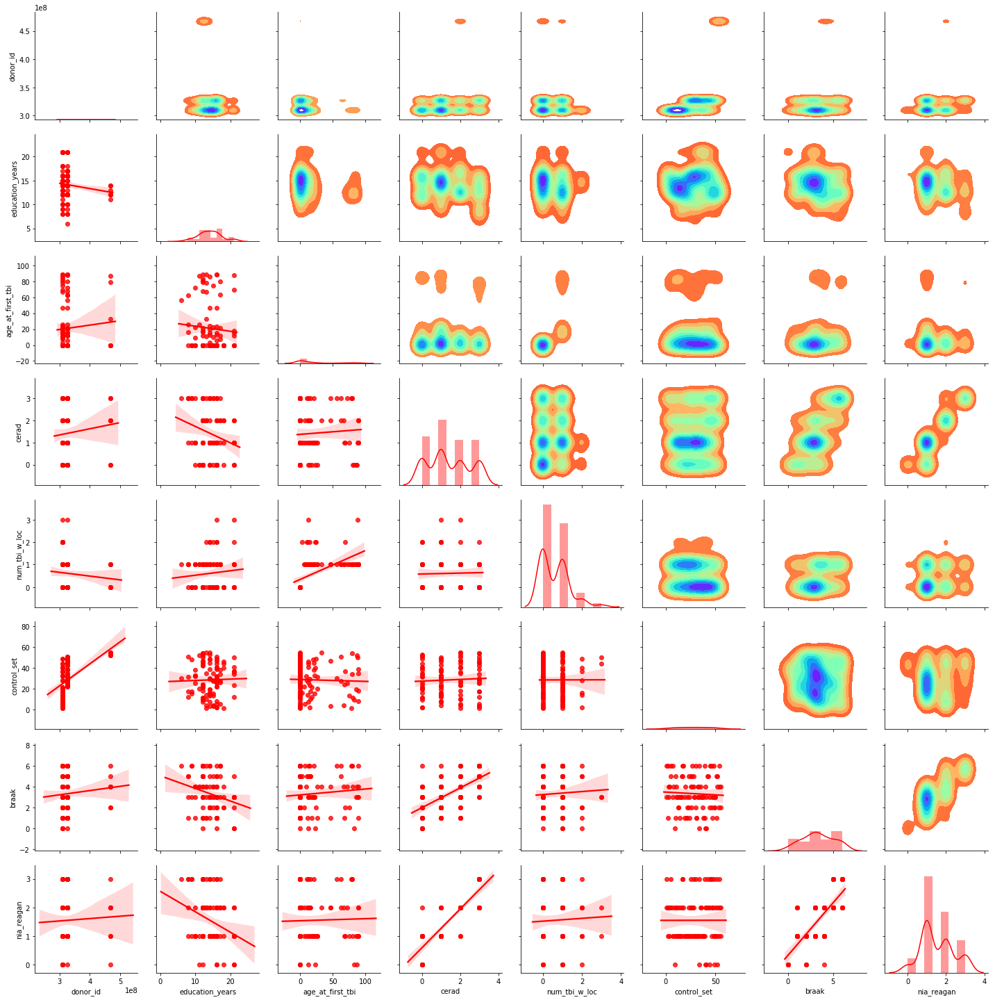

In [43]:
g = sns.PairGrid(df)
g = g.map_lower(sns.regplot, color="r") # Regression plots in lower triangle.
g = g.map_upper(sns.kdeplot, cmap= "rainbow_r", shade=True, shade_lowest=False) # KDE plots in upper triangle.
g = g.map_diag(sns.distplot, color="r") # Boxplots along diagonal.
# plt.show()

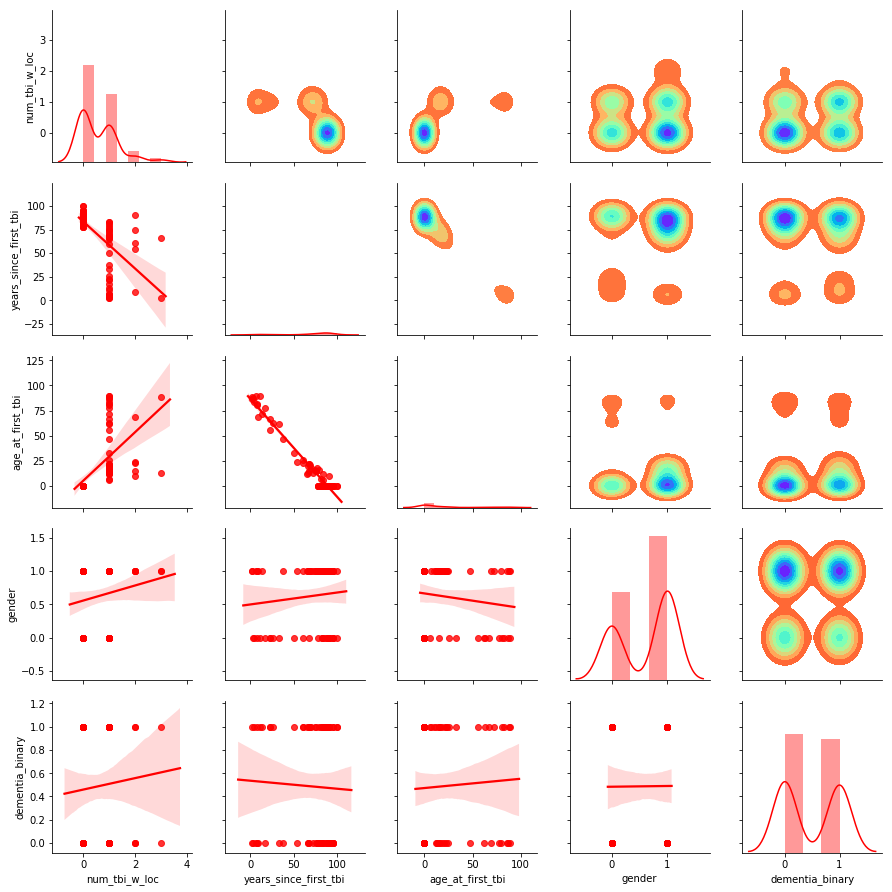

In [51]:
g = sns.PairGrid(grey[['num_tbi_w_loc', 'years_since_first_tbi', 'age_at_first_tbi', 'longest_loc_duration', 'gender', 'dementia_binary']])
g = g.map_lower(sns.regplot, color="r") # Regression plots in lower triangle.
g = g.map_upper(sns.kdeplot, cmap= "rainbow_r", shade=True, shade_lowest=False) # KDE plots in upper triangle.
g = g.map_diag(sns.distplot, color="r") # Boxplots along diagonal.
# plt.show()

In [50]:
num_tbi_w_loc, 

,num_tbi_w_loc,years_since_first_tbi,age_at_first_tbi,longest_loc_duration,gender,dementia_binary
0,0.0,87.0,0.0,Unknown or N/A,1,0
1,1.0,83.0,12.0,1-2 min,1,0
2,1.0,13.0,72.0,< 10 sec,1,1
3,1.0,3.0,87.0,< 10 sec,0,0
4,0.0,100.0,0.0,Unknown or N/A,1,1
5,0.0,95.0,0.0,Unknown or N/A,0,0
6,0.0,78.0,0.0,Unknown or N/A,1,0
7,1.0,83.0,6.0,< 10 sec,0,1
8,0.0,95.0,0.0,Unknown or N/A,1,0
9,0.0,90.0,0.0,Unknown or N/A,0,0


/Users/Katrina/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kernels.py:128: RuntimeWarning:

divide by zero encountered in true_divide

/Users/Katrina/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/kernels.py:128: RuntimeWarning:

invalid value encountered in true_divide

/Users/Katrina/anaconda3/lib/python3.6/site-packages/statsmodels/nonparametric/_kernel_base.py:513: RuntimeWarning:

invalid value encountered in true_divide

/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1480: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1481: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1480: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1481: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1480: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages

/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1480: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1481: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1480: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1481: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1480: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1481: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1480: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1481: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1480: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1481: UserWarning:


/Users/Katrina/anaconda3/lib/python3.6/s

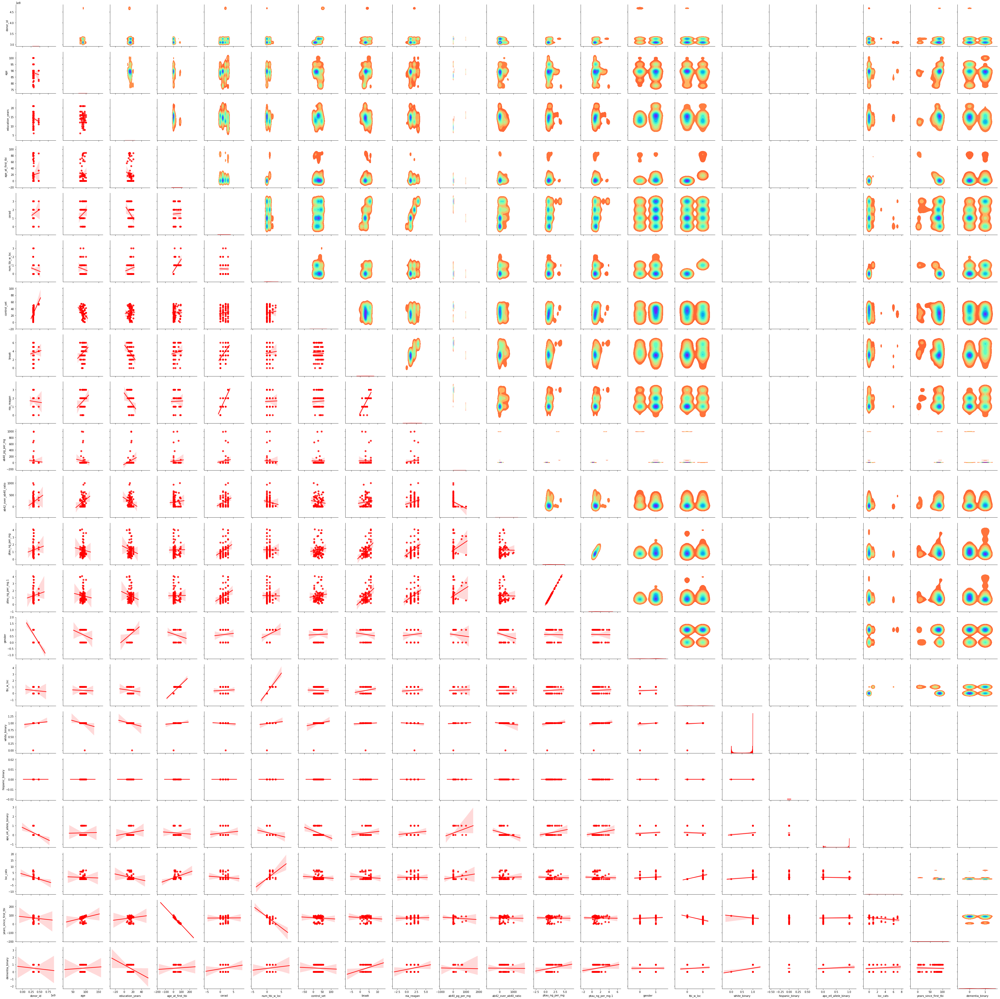

In [46]:
g = sns.PairGrid(grey)
g = g.map_lower(sns.regplot, color="r") # Regression plots in lower triangle.
g = g.map_upper(sns.kdeplot, cmap= "rainbow_r", shade=True, shade_lowest=False) # KDE plots in upper triangle.
g = g.map_diag(sns.distplot, color="r") # Boxplots along diagonal.

In [ ]:
g = sns.PairGrid(white)
g = g.map_lower(sns.regplot, color="r") # Regression plots in lower triangle.
g = g.map_upper(sns.kdeplot, cmap= "rainbow_r", shade=True, shade_lowest=False) # KDE plots in upper triangle.
g = g.map_diag(sns.distplot, color="r") # Boxplots along diagonal.